In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt 
import warnings
warnings.filterwarnings("ignore")
sb.set() # set the default Seaborn style for graphics

# Data Preparation

In [2]:
AirlineData = pd.read_csv('airline_passenger_satisfaction.csv')

In [561]:
# Drop unnecessary column
AirlineData = AirlineData.drop('ID', axis=1)

In [3]:
# impute missing values with median because the data is skewed
AirlineData['Arrival Delay'] = AirlineData['Arrival Delay'].fillna(AirlineData['Arrival Delay'].median())

In [11]:
DepartureAndArrivalTimeConvenienceCol = AirlineData['Departure and Arrival Time Convenience']
DepartureAndArrivalTimeConvenienceCol.replace(to_replace = 0, value = round(DepartureAndArrivalTimeConvenienceCol.mean()), inplace=True)

EaseOfOnlineBookingCol = AirlineData['Ease of Online Booking']
EaseOfOnlineBookingCol.replace(to_replace = 0, value = round(EaseOfOnlineBookingCol.mean()), inplace=True)

CheckInServiceCol = AirlineData['Check-in Service']
CheckInServiceCol.replace(to_replace = 0, value = round(CheckInServiceCol.mean()), inplace=True)

OnlineBoardingCol = AirlineData['Online Boarding']
OnlineBoardingCol.replace(to_replace = 0, value = round(OnlineBoardingCol.mean()), inplace=True)

GateLocationCol = AirlineData['Gate Location']
GateLocationCol.replace(to_replace = 0, value = round(GateLocationCol.mean()), inplace=True)

OnBoardServiceCol = AirlineData['On-board Service']
OnBoardServiceCol.replace(to_replace = 0, value = round(OnBoardServiceCol.mean()), inplace=True)

SeatComfortCol = AirlineData['Seat Comfort']
SeatComfortCol.replace(to_replace = 0, value = round(SeatComfortCol.mean()), inplace=True)

LegRoomServiceCol = AirlineData['Leg Room Service']
LegRoomServiceCol.replace(to_replace = 0, value = round(LegRoomServiceCol.mean()), inplace=True)

CleanlinessCol = AirlineData['Cleanliness']
CleanlinessCol.replace(to_replace = 0, value = round(CleanlinessCol.mean()), inplace=True)

FoodAndDrinkCol = AirlineData['Food and Drink']
FoodAndDrinkCol.replace(to_replace = 0, value = round(FoodAndDrinkCol.mean()), inplace=True)

InFlightServiceCol = AirlineData['In-flight Service']
InFlightServiceCol.replace(to_replace = 0, value = round(InFlightServiceCol.mean()), inplace=True)

InFlightWifiCol = AirlineData['In-flight Wifi Service']
InFlightWifiCol.replace(to_replace = 0, value = round(InFlightWifiCol.mean()), inplace=True)

InFlightEntertainmentCol = AirlineData['In-flight Entertainment']
InFlightEntertainmentCol.replace(to_replace = 0, value = round(InFlightEntertainmentCol.mean()), inplace=True)

BaggageHandlingCol = AirlineData['Baggage Handling']
BaggageHandlingCol.replace(to_replace = 0, value = round(BaggageHandlingCol.mean()), inplace=True)


In [12]:
AirlineData['Satisfaction'].replace({'Neutral or Dissatisfied': 0, 'Satisfied': 1},inplace = True)

# Machine Learning

In [14]:
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest, chi2
for data in AirlineData.columns:
    if AirlineData[data].dtype=='object':
        l_en=LabelEncoder()  
        AirlineData[data] = l_en.fit_transform(AirlineData[data])

In [15]:
def age_category(df):
    df["Age_group"] = pd.cut(x=df['Age'], bins=[0,9,25,41,57,67,76,94], labels=["0-9","10-25","26-41","42-57","58-67","68-76","77-94"])
    return df
# Call function
AirlineData = age_category(AirlineData)
group_0_9 = AirlineData[AirlineData["Age_group"] == '0-9']
group_10_25 = AirlineData[AirlineData["Age_group"] == '10-25']
group_26_41 = AirlineData[AirlineData["Age_group"] == '26-41']
group_42_57 = AirlineData[AirlineData["Age_group"] == '42-57']
group_58_67 = AirlineData[AirlineData["Age_group"] == '58-67']
group_68_76 = AirlineData[AirlineData["Age_group"] == '68-76']
group_77_94 = AirlineData[AirlineData["Age_group"] == '77-94']

## Feature selection

Feature selection is an important problem in machine learning, where we will be having several features in line and have to select the best features to build the model. The chi-square test helps us to solve the problem in feature selection by testing the relationship between the features.Higher the Chi-Square value the feature is more dependent on the response and it can be selected for model training.

In wrapper method, the feature selection algorithm exits as a wrapper around the predictive model algorithm and uses the same model to select best features. This method evaluates multiple models using procedures that add and/or remove predictors to find the optimal combination that maximizes model performance.  Though computationally expensive and prone to overfitting, gives better performance compared with Filter methods.


## Group_0_9

### Selection of top 15 features using Chi-Square

In [16]:
modelData_0_9 = group_0_9.drop(['Age_group','Age'],axis = 1)
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(modelData_0_9)
modified_data = pd.DataFrame(r_scaler.transform(modelData_0_9), columns=modelData_0_9.columns)

X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectKBest(chi2, k=15)
selector.fit(X, y)
# print(X.columns[selector.get_support(indices=True)])
selected_features = X.columns[selector.get_support(indices=True)]
scores = selector.scores_[selector.get_support(indices=True)]
feature_scores = list(zip(selected_features, scores))
sorted_feature_scores = sorted(feature_scores, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_scores]
print(sorted_features)

['In-flight Wifi Service', 'Online Boarding', 'Ease of Online Booking', 'Type of Travel', 'Class', 'Food and Drink', 'In-flight Entertainment', 'Cleanliness', 'On-board Service', 'Arrival Delay', 'Departure Delay', 'Check-in Service', 'Flight Distance', 'Seat Comfort', 'Gender']


### Importance of feature using Wrapper Method

In [20]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier as rf

X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectFromModel(rf(n_estimators=100, random_state=0))
selector.fit(X, y)
selected_features = X.columns[selector.get_support()]
importances = selector.estimator_.feature_importances_
feature_importances = list(zip(selected_features, importances))
sorted_feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_importances]
print(sorted_features)


['Online Boarding', 'Ease of Online Booking', 'In-flight Wifi Service', 'Type of Travel', 'Flight Distance', 'Class']


## group_10_25

In [21]:
modelData_10_25 = group_10_25.drop(['Age_group','Age'],axis = 1)
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(modelData_10_25)
modified_data = pd.DataFrame(r_scaler.transform(modelData_10_25), columns=modelData_10_25.columns)

X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectKBest(chi2, k=15)
selector.fit(X, y)
# print(X.columns[selector.get_support(indices=True)])
selected_features = X.columns[selector.get_support(indices=True)]
scores = selector.scores_[selector.get_support(indices=True)]
feature_scores = list(zip(selected_features, scores))
sorted_feature_scores = sorted(feature_scores, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_scores]
print(sorted_features)

['Online Boarding', 'Type of Travel', 'In-flight Wifi Service', 'Ease of Online Booking', 'Class', 'Food and Drink', 'In-flight Entertainment', 'Seat Comfort', 'Cleanliness', 'Check-in Service', 'On-board Service', 'Flight Distance', 'Customer Type', 'In-flight Service', 'Baggage Handling']


In [22]:
X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectFromModel(rf(n_estimators=100, random_state=0))
selector.fit(X, y)
selected_features = X.columns[selector.get_support()]
importances = selector.estimator_.feature_importances_
feature_importances = list(zip(selected_features, importances))
sorted_feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_importances]
print(sorted_features)

['Online Boarding', 'Ease of Online Booking', 'In-flight Wifi Service', 'Type of Travel', 'Flight Distance', 'Class']


## group_26_41

In [23]:
modelData_26_41 = group_26_41.drop(['Age_group','Age'],axis = 1)
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(modelData_26_41)
modified_data = pd.DataFrame(r_scaler.transform(modelData_26_41), columns=modelData_26_41.columns)

X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectKBest(chi2, k=15)
selector.fit(X, y)
# print(X.columns[selector.get_support(indices=True)])
selected_features = X.columns[selector.get_support(indices=True)]
scores = selector.scores_[selector.get_support(indices=True)]
feature_scores = list(zip(selected_features, scores))
sorted_feature_scores = sorted(feature_scores, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_scores]
print(sorted_features)


['Type of Travel', 'Online Boarding', 'Class', 'In-flight Entertainment', 'In-flight Wifi Service', 'Seat Comfort', 'Customer Type', 'Cleanliness', 'Food and Drink', 'Flight Distance', 'On-board Service', 'Ease of Online Booking', 'Leg Room Service', 'Check-in Service', 'Baggage Handling']


In [24]:
X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectFromModel(rf(n_estimators=100, random_state=0))
selector.fit(X, y)
selected_features = X.columns[selector.get_support()]
importances = selector.estimator_.feature_importances_
feature_importances = list(zip(selected_features, importances))
sorted_feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_importances]
print(sorted_features)

['Class', 'Flight Distance', 'Online Boarding', 'Seat Comfort', 'Customer Type', 'In-flight Entertainment', 'In-flight Wifi Service', 'Type of Travel']


## group_42_57

In [25]:
modelData_42_57 = group_42_57.drop(['Age_group','Age'],axis = 1)
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(modelData_42_57)
modified_data = pd.DataFrame(r_scaler.transform(modelData_42_57), columns=modelData_42_57.columns)

X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectKBest(chi2, k=15)
selector.fit(X, y)
# print(X.columns[selector.get_support(indices=True)])
selected_features = X.columns[selector.get_support(indices=True)]
scores = selector.scores_[selector.get_support(indices=True)]
feature_scores = list(zip(selected_features, scores))
sorted_feature_scores = sorted(feature_scores, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_scores]
print(sorted_features)


['Type of Travel', 'Class', 'Leg Room Service', 'In-flight Entertainment', 'Online Boarding', 'On-board Service', 'In-flight Wifi Service', 'Baggage Handling', 'In-flight Service', 'Seat Comfort', 'Cleanliness', 'Flight Distance', 'Check-in Service', 'Food and Drink', 'Ease of Online Booking']


In [26]:
X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectFromModel(rf(n_estimators=100, random_state=0))
selector.fit(X, y)
selected_features = X.columns[selector.get_support()]
importances = selector.estimator_.feature_importances_
feature_importances = list(zip(selected_features, importances))
sorted_feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_importances]
print(sorted_features)

['Seat Comfort', 'Leg Room Service', 'Type of Travel', 'In-flight Wifi Service', 'Online Boarding', 'In-flight Entertainment', 'Class']


## group_58_67

In [27]:
modelData_58_67 = group_58_67.drop(['Age_group','Age'],axis = 1)
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(modelData_58_67)
modified_data = pd.DataFrame(r_scaler.transform(modelData_58_67), columns=modelData_58_67.columns)

X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectKBest(chi2, k=15)
selector.fit(X, y)
# print(X.columns[selector.get_support(indices=True)])
selected_features = X.columns[selector.get_support(indices=True)]
scores = selector.scores_[selector.get_support(indices=True)]
feature_scores = list(zip(selected_features, scores))
sorted_feature_scores = sorted(feature_scores, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_scores]
print(sorted_features)


['Type of Travel', 'Class', 'Leg Room Service', 'In-flight Entertainment', 'In-flight Wifi Service', 'Online Boarding', 'On-board Service', 'Flight Distance', 'Baggage Handling', 'In-flight Service', 'Seat Comfort', 'Cleanliness', 'Ease of Online Booking', 'Check-in Service', 'Food and Drink']


In [28]:
X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectFromModel(rf(n_estimators=100, random_state=0))
selector.fit(X, y)
selected_features = X.columns[selector.get_support()]
importances = selector.estimator_.feature_importances_
feature_importances = list(zip(selected_features, importances))
sorted_feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_importances]
print(sorted_features)

['Seat Comfort', 'Leg Room Service', 'In-flight Wifi Service', 'Type of Travel', 'In-flight Entertainment', 'Online Boarding', 'Class']


## group_68_76

In [29]:
modelData_68_76 = group_68_76.drop(['Age_group','Age'],axis = 1)
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(modelData_68_76)
modified_data = pd.DataFrame(r_scaler.transform(modelData_68_76), columns=modelData_68_76.columns)

X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectKBest(chi2, k=15)
selector.fit(X, y)
# print(X.columns[selector.get_support(indices=True)])
selected_features = X.columns[selector.get_support(indices=True)]
scores = selector.scores_[selector.get_support(indices=True)]
feature_scores = list(zip(selected_features, scores))
sorted_feature_scores = sorted(feature_scores, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_scores]
print(sorted_features)


['Type of Travel', 'In-flight Wifi Service', 'Leg Room Service', 'In-flight Entertainment', 'Ease of Online Booking', 'Class', 'On-board Service', 'Online Boarding', 'Baggage Handling', 'In-flight Service', 'Cleanliness', 'Flight Distance', 'Check-in Service', 'Arrival Delay', 'Departure Delay']


In [30]:
X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectFromModel(rf(n_estimators=100, random_state=0))
selector.fit(X, y)
selected_features = X.columns[selector.get_support()]
importances = selector.estimator_.feature_importances_
feature_importances = list(zip(selected_features, importances))
sorted_feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_importances]
print(sorted_features)

['Online Boarding', 'In-flight Wifi Service', 'ID', 'Leg Room Service', 'In-flight Entertainment', 'Type of Travel', 'Flight Distance']


## group_77_94

In [31]:
modelData_77_94 = group_77_94.drop(['Age_group','Age'],axis = 1)
r_scaler = preprocessing.MinMaxScaler()
r_scaler.fit(modelData_77_94)
modified_data = pd.DataFrame(r_scaler.transform(modelData_77_94), columns=modelData_77_94.columns)

X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectKBest(chi2, k=15)
selector.fit(X, y)
# print(X.columns[selector.get_support(indices=True)])
selected_features = X.columns[selector.get_support(indices=True)]
scores = selector.scores_[selector.get_support(indices=True)]
feature_scores = list(zip(selected_features, scores))
sorted_feature_scores = sorted(feature_scores, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_scores]
print(sorted_features)


['In-flight Entertainment', 'On-board Service', 'In-flight Service', 'Leg Room Service', 'Cleanliness', 'Baggage Handling', 'In-flight Wifi Service', 'Check-in Service', 'Seat Comfort', 'Arrival Delay', 'Departure Delay', 'Online Boarding', 'Food and Drink', 'Class', 'Flight Distance']


In [32]:
X = modified_data.loc[:,modified_data.columns!='Satisfaction']
y = modified_data[['Satisfaction']]
selector = SelectFromModel(rf(n_estimators=100, random_state=0))
selector.fit(X, y)
selected_features = X.columns[selector.get_support()]
importances = selector.estimator_.feature_importances_
feature_importances = list(zip(selected_features, importances))
sorted_feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)
sorted_features = [f[0] for f in sorted_feature_importances]
print(sorted_features)

['Leg Room Service', 'ID', 'Baggage Handling', 'Cleanliness', 'In-flight Service', 'In-flight Wifi Service', 'In-flight Entertainment', 'Check-in Service', 'Seat Comfort', 'Flight Distance', 'Online Boarding']


## Checking for the nature of dataset - balanced or imbalanced
Class Imbalance is a common problem in machine learning, especially in classification problems. The accuracy of our model can be significantly impacted by imbalanced data.  if the dataset has imbalanced classes, then In such cases, we get a pretty high accuracy just by predicting the majority class, but will fail to capture the minority class, which is most often the point of creating the model in the first place. ​

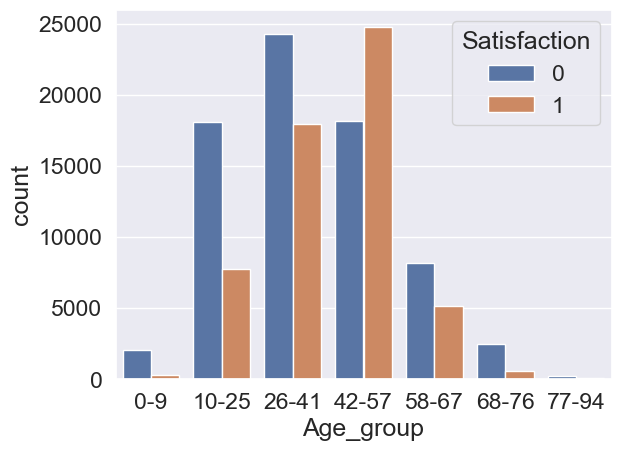

In [33]:
sb.set(font_scale=1.5)
sb.countplot(x ='Age_group', hue = "Satisfaction", data = AirlineData)
plt.show()

#### Observations: Satisfaction data for each dataset is very imbalanced so we have to handle the problem using Random Over-Sampling.

Why not Undersampling : Undersampling: removing some observations of the majority class. It is a good choice for a ton of data -think millions of rows but the drawback is that may cause a loss of valuable information.

## DataFrames with top 10 important features

In [36]:
# Import essential models and functions from sklearn
from sklearn.model_selection import train_test_split

In [37]:
target = ['Satisfaction']
features = ['In-flight Wifi Service', 'Online Boarding', 'Ease of Online Booking', 'Arrival Delay', 
            'Type of Travel', 'Class', 'Food and Drink', 'In-flight Entertainment', 'Cleanliness', 'Flight Distance']
y = group_0_9[target]
X = group_0_9[features]
group_0_9_model = pd.concat([X, y], axis=1)
# Split the Dataset into Train and Test
X_train_0_9, X_test_0_9, y_train_0_9, y_test_0_9 = train_test_split(X, y, test_size = 0.3)

In [38]:
target = ['Satisfaction']
features = ['Online Boarding', 'Type of Travel', 'In-flight Wifi Service', 'Ease of Online Booking', 'Class', 
            'Food and Drink', 'Arrival Delay', 'In-flight Entertainment', 'Seat Comfort','Flight Distance']
y = group_10_25[target]
X = group_10_25[features]
group_10_25_model = pd.concat([X, y], axis=1)
# Split the Dataset into Train and Test
X_train_10_25, X_test_10_25, y_train_10_25, y_test_10_25 = train_test_split(X, y, test_size = 0.3)

In [39]:
target = ['Satisfaction']
features = ['Type of Travel', 'Online Boarding', 'Class', 'In-flight Entertainment', 'In-flight Wifi Service', 
            'Seat Comfort', 'Customer Type', 'Cleanliness', 'Flight Distance', 'Food and Drink']
y = group_26_41[target]
X = group_26_41[features]
group_26_41_model = pd.concat([X, y], axis=1)
# Split the Dataset into Train and Test
X_train_26_41, X_test_26_41, y_train_26_41, y_test_26_41 = train_test_split(X, y, test_size = 0.3)

In [40]:
target = ['Satisfaction']
features = ['Type of Travel', 'Class', 'Leg Room Service', 'In-flight Entertainment', 'Online Boarding', 
            'On-board Service', 'In-flight Wifi Service', 'Flight Distance', 'Baggage Handling', 'Seat Comfort']
y = group_42_57[target]
X = group_42_57[features]
group_42_57_model = pd.concat([X, y], axis=1)
# Split the Dataset into Train and Test
X_train_42_57, X_test_42_57, y_train_42_57, y_test_42_57 = train_test_split(X, y, test_size = 0.3)

In [41]:
target = ['Satisfaction']
features = ['Type of Travel', 'Class', 'Leg Room Service', 'In-flight Entertainment', 'In-flight Wifi Service', 
            'Online Boarding', 'On-board Service', 'Flight Distance', 'Baggage Handling', 'In-flight Service']
y = group_58_67[target]
X = group_58_67[features]
group_58_67_model = pd.concat([X, y], axis=1)
# Split the Dataset into Train and Test
X_train_58_67, X_test_58_67, y_train_58_67, y_test_58_67 = train_test_split(X, y, test_size = 0.3)

In [42]:
target = ['Satisfaction']
features = ['Type of Travel', 'In-flight Wifi Service', 'Leg Room Service', 'Arrival Delay', 'In-flight Entertainment',
            'Ease of Online Booking', 'Class', 'On-board Service', 'Online Boarding', 'Baggage Handling','Flight Distance',]
y = group_68_76[target]
X = group_68_76[features]
group_68_76_model = pd.concat([X, y], axis=1)
# Split the Dataset into Train and Test
X_train_68_76, X_test_68_76, y_train_68_76, y_test_68_76 = train_test_split(X, y, test_size = 0.3)


In [43]:
target = ['Satisfaction']
features = ['In-flight Entertainment', 'On-board Service', 'In-flight Service', 'Arrival Delay', 'Leg Room Service', 
            'Cleanliness', 'In-flight Wifi Service', 'Check-in Service', 'Seat Comfort',  'Flight Distance']
y = group_77_94[target]
X = group_77_94[features]
group_77_94_model = pd.concat([X, y], axis=1)
# Split the Dataset into Train and Test
X_train_77_94, X_test_77_94, y_train_77_94, y_test_77_94 = train_test_split(X, y, test_size = 0.3)

## Balancing Functions

In [46]:
def balancing0(dataframe):
    # Class count
    satisfaction_class_0, satisfaction_class_1 = dataframe.Satisfaction.value_counts()
    # Divide by class
    df_satisfaction_0 = dataframe[dataframe['Satisfaction'] == 0]
    df_satisfaction_1 = dataframe[dataframe['Satisfaction'] == 1]

    df_satisfaction_1_over = df_satisfaction_1.sample(satisfaction_class_0, replace=True)
    dataframe = pd.concat([df_satisfaction_0, df_satisfaction_1_over], axis=0)
    return dataframe


In [47]:
def balancing1(dataframe):
    # Class count
    satisfaction_class_1, satisfaction_class_0 = dataframe.Satisfaction.value_counts()
    # Divide by class
    df_satisfaction_0 = dataframe[dataframe['Satisfaction'] == 0]
    df_satisfaction_1 = dataframe[dataframe['Satisfaction'] == 1]

    df_satisfaction_0_over = df_satisfaction_0.sample(satisfaction_class_1, replace=True)
    dataframe = pd.concat([df_satisfaction_1, df_satisfaction_0_over], axis=0)
    return dataframe


In [50]:
group_0_9_model = balancing0(group_0_9_model)
group_10_25_model = balancing0(group_10_25_model)
group_26_41_model = balancing0(group_26_41_model)
group_42_57_model = balancing1(group_42_57_model)
group_58_67_model = balancing0(group_58_67_model)
group_68_76_model = balancing0(group_68_76_model)
group_77_94_model = balancing0(group_77_94_model)

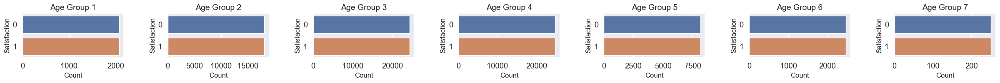

In [51]:
groups = [group_0_9_model,group_10_25_model,group_26_41_model,group_42_57_model,group_58_67_model,group_68_76_model,group_77_94_model]
fig, axs = plt.subplots(1, 7, figsize=(25, 3))
sb.set(font_scale=1.2)
for i, group in enumerate(groups):
    sb.countplot(y="Satisfaction", data=group, ax=axs[i])
    axs[i].set_title(f"Age Group {i+1}", fontsize=14)
    axs[i].set_xlabel("Count", fontsize=12)
    axs[i].set_ylabel("Satisfaction", fontsize=12)

# Adjust the layout and spacing
plt.tight_layout(pad=3)

# Show the plot
plt.show()

# LazyPredict


At this stage, we didn't know how to choose an algorithm when training a Machine Learning model, so we decided to use the Lazy Predict library in Python to compare the performance of different Machine Learning models based on classification.

In [52]:
!pip install lazypredict
from lazypredict.Supervised import LazyClassifier

In [55]:
clf = LazyClassifier(verbose=0,
                     ignore_warnings=True, 
                     custom_metric=None)
models, predictions = clf.fit(X_train_0_9, X_test_0_9, y_train_0_9, y_test_0_9)
models

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 27.62it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
PassiveAggressiveClassifier,0.82,0.79,0.79,0.85,0.01
QuadraticDiscriminantAnalysis,0.83,0.79,0.79,0.86,0.01
NearestCentroid,0.79,0.78,0.78,0.83,0.01
ExtraTreesClassifier,0.92,0.76,0.76,0.92,0.11
ExtraTreeClassifier,0.90,0.76,0.76,0.90,0.01
GaussianNB,0.83,0.75,0.75,0.86,0.01
RandomForestClassifier,0.92,0.75,0.75,0.92,0.13
LabelPropagation,0.92,0.75,0.75,0.92,0.07
LabelSpreading,0.92,0.75,0.75,0.92,0.10


In [56]:
clf = LazyClassifier(verbose=0,
                     ignore_warnings=True, 
                     custom_metric=None)
models, predictions = clf.fit(X_train_10_25, X_test_10_25, y_train_10_25, y_test_10_25)
models

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:43<00:00,  1.52s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LGBMClassifier,0.91,0.88,0.88,0.91,0.19
XGBClassifier,0.91,0.88,0.88,0.90,0.41
KNeighborsClassifier,0.89,0.86,0.86,0.89,0.30
RandomForestClassifier,0.89,0.86,0.86,0.89,1.01
LabelPropagation,0.89,0.86,0.86,0.89,8.45
ExtraTreesClassifier,0.89,0.86,0.86,0.89,0.80
LabelSpreading,0.89,0.86,0.86,0.89,12.88
BaggingClassifier,0.89,0.86,0.86,0.89,0.24
SVC,0.90,0.85,0.85,0.89,5.05


In [57]:
clf = LazyClassifier(verbose=0,
                     ignore_warnings=True, 
                     custom_metric=None)
models, predictions = clf.fit(X_train_26_41, X_test_26_41, y_train_26_41, y_test_26_41)
models

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [02:37<00:00,  5.43s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LGBMClassifier,0.93,0.92,0.92,0.93,0.24
XGBClassifier,0.92,0.92,0.92,0.92,0.65
SVC,0.92,0.91,0.91,0.92,12.15
LabelSpreading,0.92,0.91,0.91,0.92,61.11
LabelPropagation,0.91,0.91,0.91,0.91,40.52
KNeighborsClassifier,0.91,0.91,0.91,0.91,0.47
RandomForestClassifier,0.91,0.90,0.90,0.91,1.52
BaggingClassifier,0.91,0.90,0.90,0.91,0.35
ExtraTreesClassifier,0.90,0.90,0.90,0.90,1.33


In [58]:
clf = LazyClassifier(verbose=0,
                     ignore_warnings=True, 
                     custom_metric=None)
models, predictions = clf.fit(X_train_42_57, X_test_42_57, y_train_42_57, y_test_42_57)
models

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [03:32<00:00,  7.33s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LGBMClassifier,0.94,0.94,0.94,0.94,0.27
XGBClassifier,0.94,0.94,0.94,0.94,0.75
RandomForestClassifier,0.94,0.94,0.94,0.94,1.62
BaggingClassifier,0.94,0.94,0.94,0.94,0.41
ExtraTreesClassifier,0.94,0.94,0.94,0.94,1.28
KNeighborsClassifier,0.93,0.93,0.93,0.93,0.61
SVC,0.93,0.93,0.93,0.93,9.92
LabelSpreading,0.93,0.93,0.93,0.93,103.40
LabelPropagation,0.93,0.93,0.93,0.93,39.69


In [59]:
clf = LazyClassifier(verbose=0,
                     ignore_warnings=True, 
                     custom_metric=None)
models, predictions = clf.fit(X_train_58_67, X_test_58_67, y_train_58_67, y_test_58_67)
models

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:12<00:00,  2.38it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LGBMClassifier,0.94,0.92,0.92,0.93,0.16
XGBClassifier,0.93,0.92,0.92,0.93,0.26
RandomForestClassifier,0.93,0.92,0.92,0.93,0.50
SVC,0.93,0.92,0.92,0.93,1.10
ExtraTreesClassifier,0.92,0.92,0.92,0.92,0.41
BaggingClassifier,0.92,0.91,0.91,0.92,0.12
LabelSpreading,0.92,0.91,0.91,0.92,3.09
LabelPropagation,0.92,0.91,0.91,0.92,2.07
KNeighborsClassifier,0.92,0.90,0.90,0.92,0.16


In [60]:
clf = LazyClassifier(verbose=0,
                     ignore_warnings=True, 
                     custom_metric=None)
models, predictions = clf.fit(X_train_68_76, X_test_68_76, y_train_68_76, y_test_68_76)
models

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 21.06it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
ExtraTreesClassifier,0.92,0.84,0.84,0.92,0.14
LGBMClassifier,0.93,0.83,0.83,0.93,0.12
DecisionTreeClassifier,0.90,0.83,0.83,0.90,0.01
RandomForestClassifier,0.93,0.82,0.82,0.92,0.17
XGBClassifier,0.92,0.82,0.82,0.92,0.12
BaggingClassifier,0.92,0.82,0.82,0.92,0.04
ExtraTreeClassifier,0.88,0.80,0.80,0.88,0.01
SVC,0.92,0.80,0.80,0.91,0.08
LabelPropagation,0.89,0.80,0.80,0.89,0.11


In [97]:
clf = LazyClassifier(verbose=0,
                     ignore_warnings=True, 
                     custom_metric=None)
models, predictions = clf.fit(X_train_77_94, X_test_77_94, y_train_77_94, y_test_77_94)
models

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 63.09it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
GaussianNB,0.81,0.79,0.79,0.81,0.01
ExtraTreesClassifier,0.84,0.78,0.78,0.83,0.06
QuadraticDiscriminantAnalysis,0.82,0.77,0.77,0.82,0.01
LGBMClassifier,0.84,0.77,0.77,0.83,0.04
RandomForestClassifier,0.84,0.77,0.77,0.83,0.07
NearestCentroid,0.79,0.77,0.77,0.79,0.01
SVC,0.83,0.76,0.76,0.82,0.01
SGDClassifier,0.81,0.75,0.75,0.80,0.01
XGBClassifier,0.82,0.74,0.74,0.81,0.05


#### Observations: It appears that the LGBMClassifier model is a suitable and effective choice for all generations.

#### The accuracy of the Group_77_94 age group is notably lower than the other groups. The reason might be due to the limited number of data samples in this age group, which may not adequately represent all possible input data values. 

## For storing accuacy of all models for each group

In [63]:
group_0_9_accuracy = {}
group_10_25_accuracy = {}
group_26_41_accuracy = {}
group_42_57_accuracy = {}
group_58_67_accuracy = {}
group_68_76_accuracy = {}
group_77_94_accuracy = {}

# DecisionTreeClassifier
Despite the fact that LazyPredict has shown that DecisionTreeClassifier has lower accuracy compared to other models across all age groups, we have opted to utilize it as our initial prediction model. This decision was made because DecisionTreeClassifier is a relatively straightforward and easy-to-grasp concept that we learned in our labs, and it is also highly interpretable. In fact, decision trees can be graphically represented, making it easier to visualize and understand the decision-making process of the model.

In [89]:
# Import essential models and functions from sklearn
def decisionTree(dataframe, accuracy):
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import confusion_matrix
    from sklearn.tree import plot_tree

    # Extract Response and Predictors
    y = pd.DataFrame(dataframe['Satisfaction'])
    X = pd.DataFrame(dataframe.drop('Satisfaction', axis = 1))

    # Split the Dataset into Train and Test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

    # Decision Tree using Train Data
    dectree = DecisionTreeClassifier(max_depth = 7)  
    dectree.fit(X_train, y_train)                    

    # Plot the trained Decision Tree
    f = plt.figure(figsize=(200,40))
    plot_tree(dectree, filled=True, rounded=True, 
              feature_names=X_train.columns, 
              fontsize = 10,
              class_names=["Neutral or Dissatisfied","Satisfaction"])
    plt.show()
    
    # Predict the Response corresponding to Predictors
    y_train_pred = dectree.predict(X_train)
    
    # Print the Accuracy Measures from the Confusion Matrix
    cmTrain = confusion_matrix(y_train, y_train_pred)
    tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
    fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
    tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
    fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)
    
    # Predict the Response corresponding to Predictors
    y_test_pred = dectree.predict(X_test)
    
    # Print the Accuracy Measures from the Confusion Matrix
    cmTest = confusion_matrix(y_test, y_test_pred)
    tpTest = cmTest[1][1] # True Positives : Good (1) predicted Good (1)
    fpTest = cmTest[0][1] # False Positives : Bad (0) predicted Good (1)
    tnTest = cmTest[0][0] # True Negatives : Bad (0) predicted Bad (0)
    fnTest = cmTest[1][0] # False Negatives : Good (1) predicted Bad (0)
    
    print(f"Train Accuracy: {dectree.score(X_train, y_train):.5f} | Test Accuracy: {dectree.score(X_test, y_test):.5f}")    
    print(f"TPR Train:      {tpTrain/(tpTrain + fnTrain):.5f}     | TPR Test: {tpTest/(tpTest + fnTest):.5f}")
    print(f"TNR Train:      {tnTrain/(tnTrain + fpTrain):.5f}     | TNR Test: {tnTest/(tnTest + fpTest):.5f}")
    print(f"FPR Train:      {fpTrain/(tnTrain + fpTrain):.5f}     | FPR Test: {fpTest/(fpTest + tnTest):.5f}")
    print(f"FNR Train:      {fnTrain/(tpTrain + fnTrain):.5f}     | FNR Test: {fnTest/(fnTest + tpTest):.5f}")

    accuracy.update({"dectree_train": dectree.score(X_train, y_train)})
    accuracy.update({"dectree_test": dectree.score(X_test, y_test)})
    
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18, 5))

    # Plot confusion matrix for training data
    sb.heatmap(confusion_matrix(y_train, y_train_pred), annot=True, fmt=".0f", annot_kws={"size": 12}, ax=axs[0])
    axs[0].set_title('Confusion Matrix (Train)')

    # Plot confusion matrix for test data
    sb.heatmap(confusion_matrix(y_test, y_test_pred), annot=True, fmt=".0f", annot_kws={"size": 12}, ax=axs[1])
    axs[1].set_title('Confusion Matrix (Test)')

    # Plot feature importance
    importance = dectree.feature_importances_
    indices = np.argsort(importance)[::-1]
    sb.barplot(x=importance[indices], y=X_train.columns[indices], palette='Blues_d', ax=axs[2])
    axs[2].set_xlabel("Importance", fontsize=12)
    axs[2].set_title("Feature Importance")

    plt.tight_layout()
    plt.show()




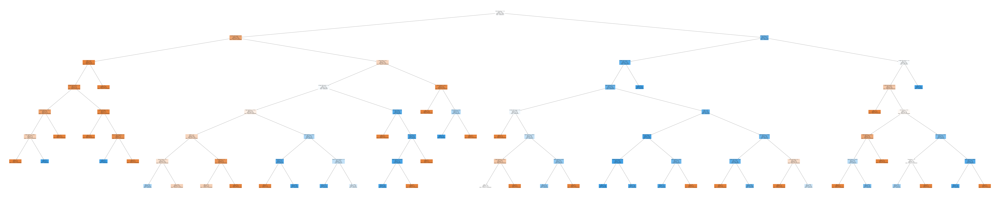

Train Accuracy: 0.89476 | Test Accuracy: 0.87601
TPR Train:      0.91078     | TPR Test: 0.92170
TNR Train:      0.87856     | TNR Test: 0.83148
FPR Train:      0.12144     | FPR Test: 0.16852
FNR Train:      0.08922     | FNR Test: 0.07830


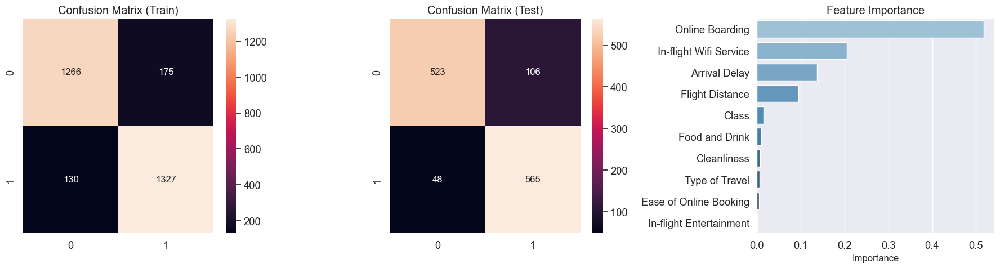

In [90]:
decisionTree(group_0_9_model,group_0_9_accuracy)

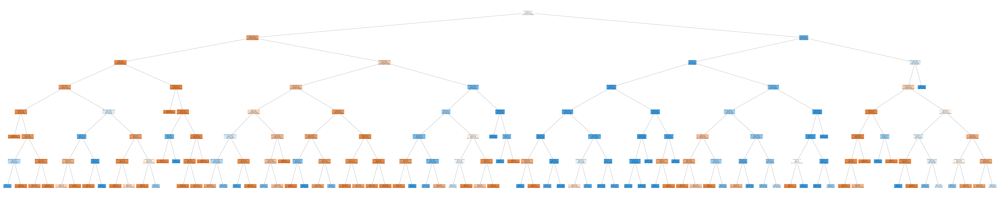

Train Accuracy: 0.89296 | Test Accuracy: 0.88480
TPR Train:      0.90474     | TPR Test: 0.89668
TNR Train:      0.88124     | TNR Test: 0.87278
FPR Train:      0.11876     | FPR Test: 0.12722
FNR Train:      0.09526     | FNR Test: 0.10332


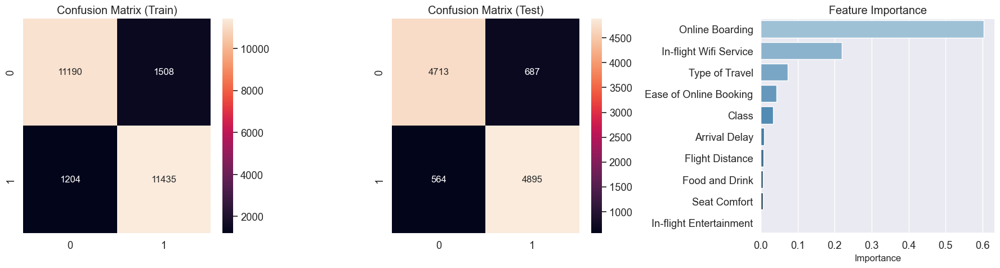

In [91]:
decisionTree(group_10_25_model,group_10_25_accuracy)

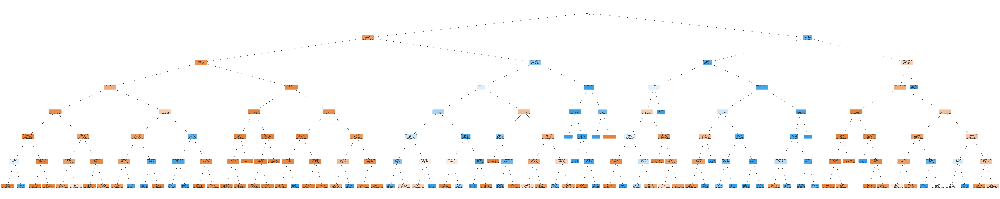

Train Accuracy: 0.91450 | Test Accuracy: 0.91193
TPR Train:      0.89038     | TPR Test: 0.88935
TNR Train:      0.93829     | TNR Test: 0.93525
FPR Train:      0.06171     | FPR Test: 0.06475
FNR Train:      0.10962     | FNR Test: 0.11065


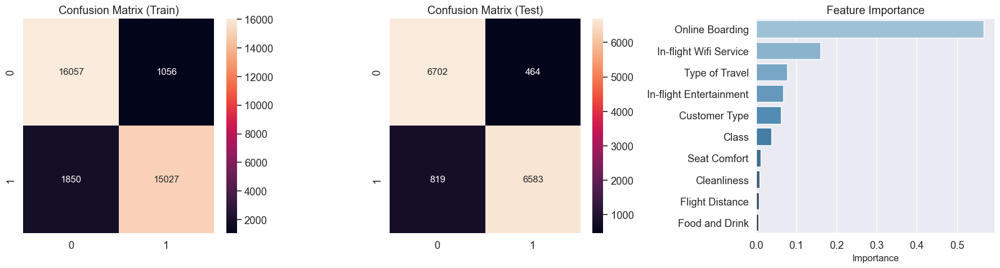

In [92]:
decisionTree(group_26_41_model,group_26_41_accuracy)

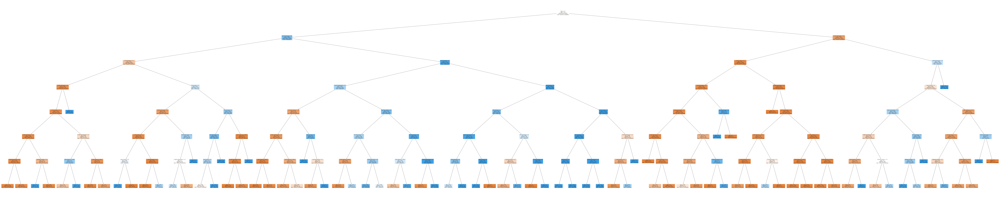

Train Accuracy: 0.92889 | Test Accuracy: 0.92637
TPR Train:      0.91661     | TPR Test: 0.91367
TNR Train:      0.94113     | TNR Test: 0.93916
FPR Train:      0.05887     | FPR Test: 0.06084
FNR Train:      0.08339     | FNR Test: 0.08633


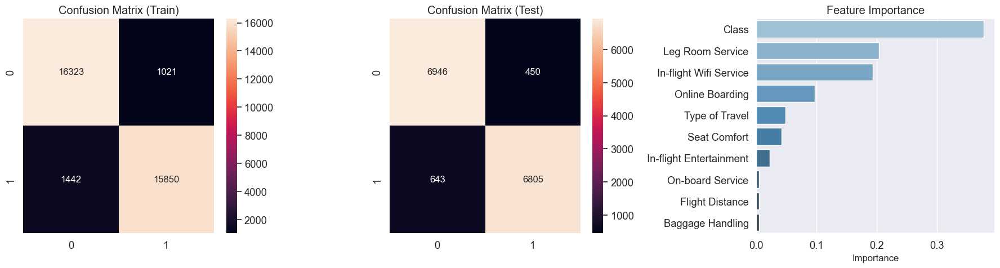

In [93]:
decisionTree(group_42_57_model,group_42_57_accuracy)

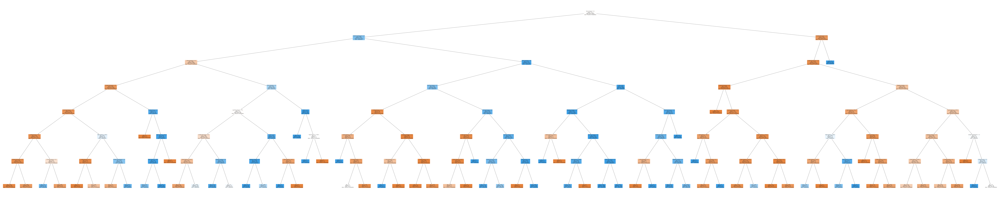

Train Accuracy: 0.92619 | Test Accuracy: 0.91634
TPR Train:      0.90736     | TPR Test: 0.90081
TNR Train:      0.94484     | TNR Test: 0.93220
FPR Train:      0.05516     | FPR Test: 0.06780
FNR Train:      0.09264     | FNR Test: 0.09919


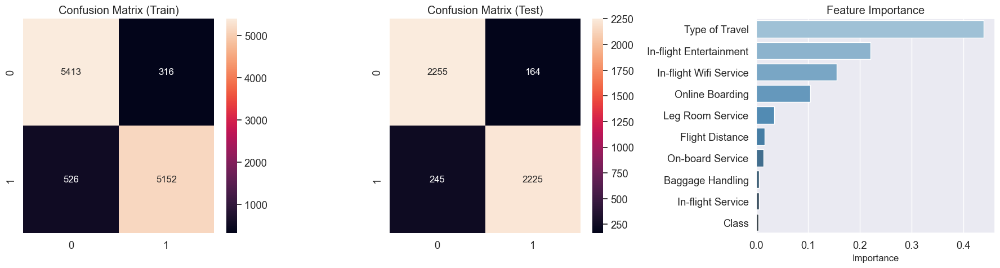

In [94]:
decisionTree(group_58_67_model,group_58_67_accuracy)

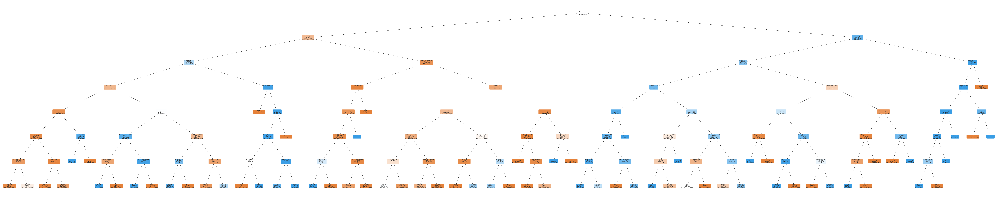

Train Accuracy: 0.92194 | Test Accuracy: 0.88769
TPR Train:      0.95257     | TPR Test: 0.93724
TNR Train:      0.89109     | TNR Test: 0.83893
FPR Train:      0.10891     | FPR Test: 0.16107
FNR Train:      0.04743     | FNR Test: 0.06276


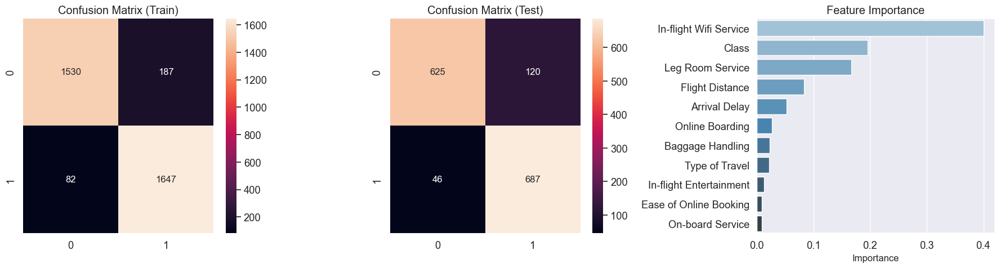

In [95]:
decisionTree(group_68_76_model,group_68_76_accuracy)

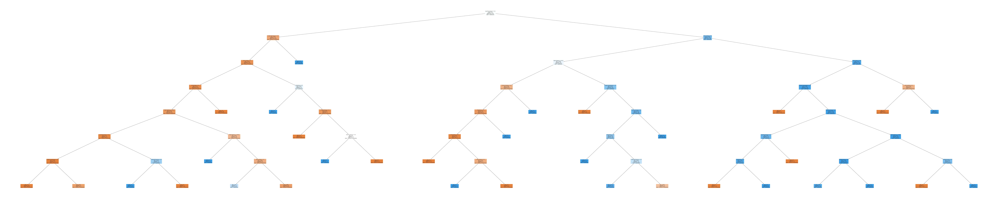

Train Accuracy: 0.96581 | Test Accuracy: 0.93377
TPR Train:      0.95480     | TPR Test: 0.94595
TNR Train:      0.97701     | TNR Test: 0.92208
FPR Train:      0.02299     | FPR Test: 0.07792
FNR Train:      0.04520     | FNR Test: 0.05405


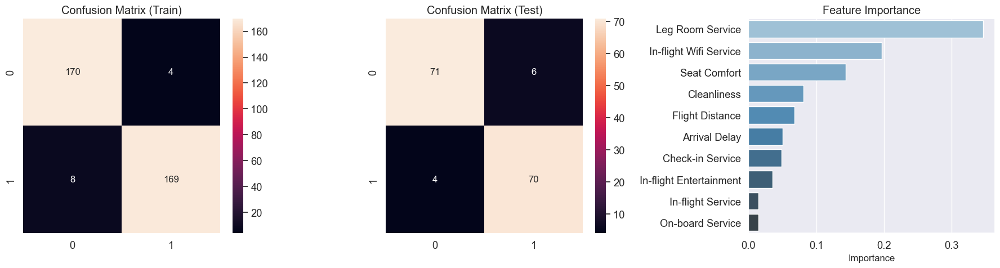

In [96]:
decisionTree(group_77_94_model,group_77_94_accuracy)

#### Observations: There is a considerable difference between the training and testing accuracies for the age group Group_77_94 in our model compared to the outcomes predicted by LazyPredict. This discrepancy highlights that LazyPredict's predictions may not always be entirely accurate and reliable, and it may not always be the best approach to determine the optimal machine learning model for a given dataset. It is essential to carefully evaluate and fine-tune the model to ensure its reliability and accuracy, and this may involve experimentation with various hyperparameters and modeling techniques to achieve the best possible performance.

# LGBMClassifier

In [98]:
def lgbmc(dataframe, accuracy):
    import lightgbm as lgb
    from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
    
    # Extract Response and Predictors
    y = pd.DataFrame(dataframe['Satisfaction'])
    X = pd.DataFrame(dataframe.drop('Satisfaction', axis = 1))

    # Split the Dataset into Train and Test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)
    
    classification = lgb.LGBMClassifier()
    classification.fit(X_train, y_train)
    # predict the results
    y_train_pred = classification.predict(X_train)
    # Print the Classification Accuracy
    # Print the Classification Accuracy for Train and Test
   
    # Print the Accuracy Measures from the Confusion Matrix
    cmTrain = confusion_matrix(y_train, y_train_pred)
    tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
    fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
    tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
    fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

    # Predict the Response corresponding to Predictors
    y_test_pred = classification.predict(X_test)

    # Print the Accuracy Measures from the Confusion Matrix
    cmTest = confusion_matrix(y_test, y_test_pred)
    tpTest = cmTest[1][1] # True Positives : Good (1) predicted Good (1)
    fpTest = cmTest[0][1] # False Positives : Bad (0) predicted Good (1)
    tnTest = cmTest[0][0] # True Negatives : Bad (0) predicted Bad (0)
    fnTest = cmTest[1][0] # False Negatives : Good (1) predicted Bad (0)

    print(f"Train Accuracy: {classification.score(X_train, y_train):.5f} | Test Accuracy: {classification.score(X_test, y_test):.5f}")    
    print(f"TPR Train:      {tpTrain/(tpTrain + fnTrain):.5f}            | TPR Test: {tpTest/(tpTest + fnTest):.5f}")
    print(f"TNR Train:      {tnTrain/(tnTrain + fpTrain):.5f}            | TNR Test: {tnTest/(tnTest + fpTest):.5f}")
    print(f"FPR Train:      {fpTrain/(tnTrain + fpTrain):.5f}            | FPR Test: {fpTest/(fpTest + tnTest):.5f}")
    print(f"FNR Train:      {fnTrain/(tpTrain + fnTrain):.5f}            | FNR Test: {fnTest/(fnTest + tpTest):.5f}")

    
    accuracy.update({"lgbmc_train":  classification.score(X_train, y_train)})
    accuracy.update({"lgbmc_test":  classification.score(X_test, y_test)})
    

    
    
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18, 5))
    # Plot confusion matrix for training data
    sb.heatmap(confusion_matrix(y_train, y_train_pred), annot=True, fmt=".0f", annot_kws={"size": 12}, ax=axs[0])
    axs[0].set_title('Confusion Matrix (Train)')

    # Plot confusion matrix for test data
    sb.heatmap(confusion_matrix(y_test, y_test_pred), annot=True, fmt=".0f", annot_kws={"size": 12}, ax=axs[1])
    axs[1].set_title('Confusion Matrix (Test)')

    # Plot feature importance
    importance = classification.feature_importances_
    indices = np.argsort(importance)[::-1]
    sb.barplot(x=importance[indices], y=X_train.columns[indices], palette='Blues_d', ax=axs[2])
    axs[2].set_xlabel("Importance", fontsize=12)
    axs[2].set_title("Feature Importance")

    plt.tight_layout()
    plt.show()
    

Train Accuracy: 0.98620 | Test Accuracy: 0.94364
TPR Train:      0.99861            | TPR Test: 0.99204
TNR Train:      0.97390            | TNR Test: 0.89414
FPR Train:      0.02610            | FPR Test: 0.10586
FNR Train:      0.00139            | FNR Test: 0.00796


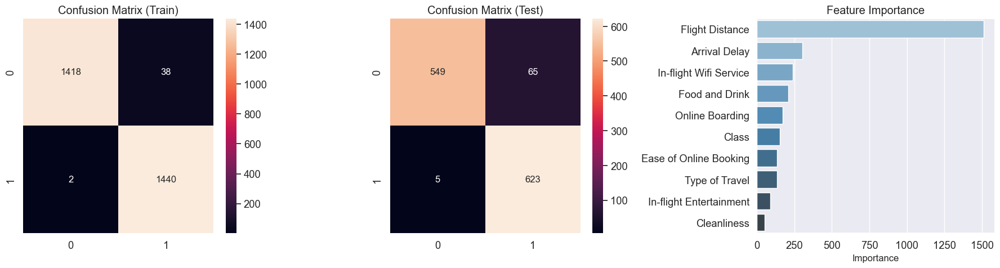

In [99]:
lgbmc(group_0_9_model,group_0_9_accuracy)

Train Accuracy: 0.91321 | Test Accuracy: 0.90542
TPR Train:      0.90733            | TPR Test: 0.89938
TNR Train:      0.91900            | TNR Test: 0.91168
FPR Train:      0.08100            | FPR Test: 0.08832
FNR Train:      0.09267            | FNR Test: 0.10062


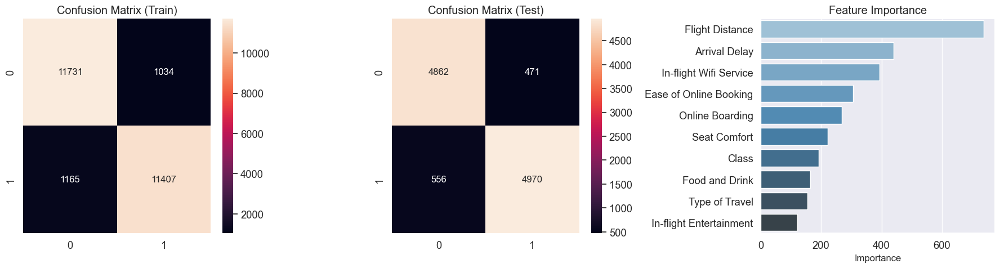

In [100]:
lgbmc(group_10_25_model,group_10_25_accuracy)

Train Accuracy: 0.93448 | Test Accuracy: 0.93163
TPR Train:      0.92062            | TPR Test: 0.91847
TNR Train:      0.94832            | TNR Test: 0.94484
FPR Train:      0.05168            | FPR Test: 0.05516
FNR Train:      0.07938            | FNR Test: 0.08153


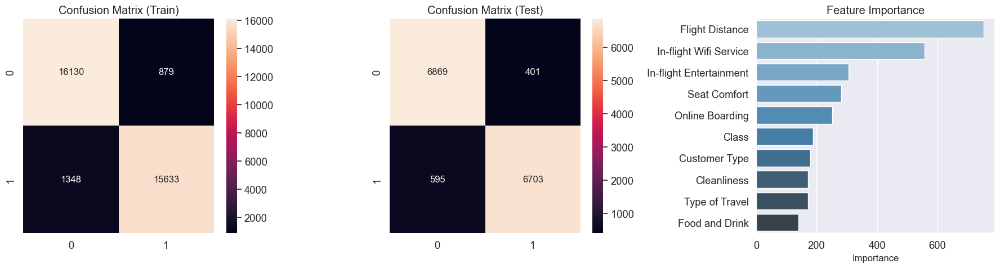

In [101]:
lgbmc(group_26_41_model,group_26_41_accuracy)

Train Accuracy: 0.95808 | Test Accuracy: 0.94954
TPR Train:      0.93534            | TPR Test: 0.93098
TNR Train:      0.98087            | TNR Test: 0.96801
FPR Train:      0.01913            | FPR Test: 0.03199
FNR Train:      0.06466            | FNR Test: 0.06902


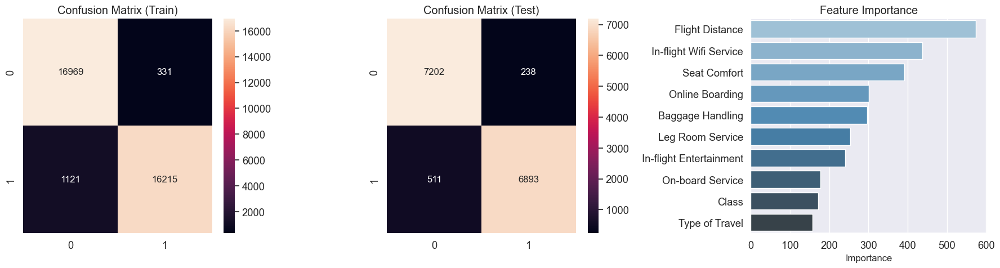

In [102]:
lgbmc(group_42_57_model,group_42_57_accuracy)

Train Accuracy: 0.96414 | Test Accuracy: 0.94702
TPR Train:      0.94583            | TPR Test: 0.93361
TNR Train:      0.98258            | TNR Test: 0.96023
FPR Train:      0.01742            | FPR Test: 0.03977
FNR Train:      0.05417            | FNR Test: 0.06639


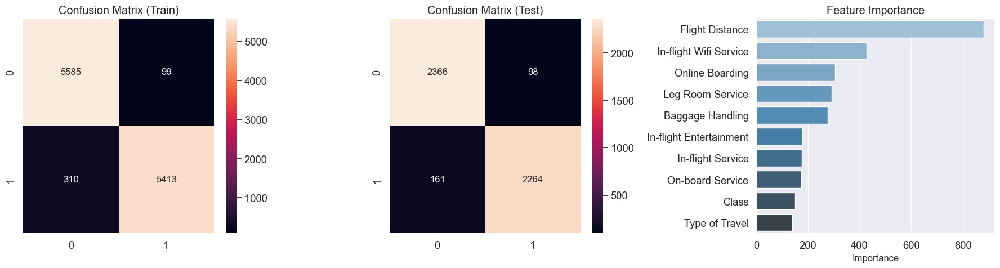

In [103]:
lgbmc(group_58_67_model,group_58_67_accuracy)

Train Accuracy: 0.99420 | Test Accuracy: 0.95940
TPR Train:      0.99593            | TPR Test: 0.97432
TNR Train:      0.99246            | TNR Test: 0.94444
FPR Train:      0.00754            | FPR Test: 0.05556
FNR Train:      0.00407            | FNR Test: 0.02568


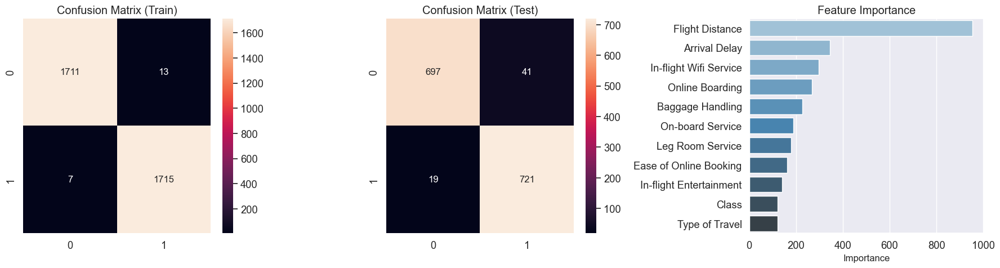

In [104]:
lgbmc(group_68_76_model,group_68_76_accuracy)

Train Accuracy: 1.00000 | Test Accuracy: 0.96689
TPR Train:      1.00000            | TPR Test: 0.98718
TNR Train:      1.00000            | TNR Test: 0.94521
FPR Train:      0.00000            | FPR Test: 0.05479
FNR Train:      0.00000            | FNR Test: 0.01282


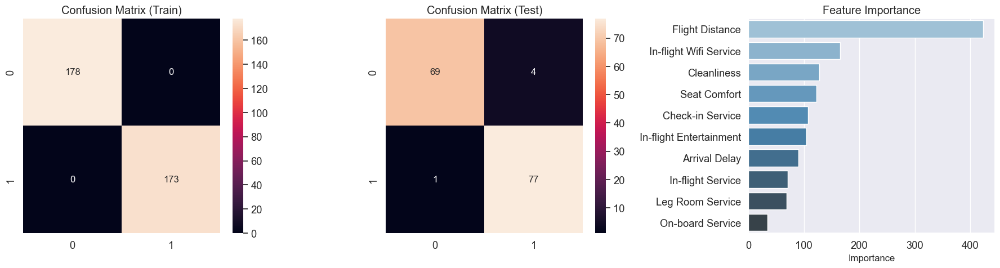

In [108]:
lgbmc(group_77_94_model,group_77_94_accuracy)

#### Observations:The training accuracy for the age group Group_77_94 has been recorded as 1, indicating that the model is likely overfitting to the training data. This could be due to the relatively small size of the data in this age group, making it challenging for the model to generalize its predictions to unseen data. 
#### Overall: LGBMClassifier perform well for all age groups data.

# RandomForest

In [110]:
def randomForest(dataframe, estim, mdepth, accuracy):
    # Import essential models and functions from sklearn
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import confusion_matrix

    # Extract Response and Predictors
    y = pd.DataFrame(dataframe['Satisfaction'])
    X = pd.DataFrame(dataframe.drop('Satisfaction', axis = 1))


    # Split the Dataset into Train and Test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

    # Import RandomForestClassifier model from Scikit-Learn
    from sklearn.ensemble import RandomForestClassifier

    # Create the Random Forest object:
    rforest = RandomForestClassifier(n_estimators = estim, max_depth = mdepth) 

    # Fit Random Forest on Train Data
    rforest.fit(X_train, y_train.Satisfaction.ravel())

    # Predict the Response corresponding to Predictors
    y_train_pred = rforest.predict(X_train)
    y_test_pred = rforest.predict(X_test)

    # Print the Accuracy Measures from the Confusion Matrix
    cmTrain = confusion_matrix(y_train, y_train_pred)
    tpTrain = cmTrain[1][1] # True Positives : Good (1) predicted Good (1)
    fpTrain = cmTrain[0][1] # False Positives : Bad (0) predicted Good (1)
    tnTrain = cmTrain[0][0] # True Negatives : Bad (0) predicted Bad (0)
    fnTrain = cmTrain[1][0] # False Negatives : Good (1) predicted Bad (0)

    # Predict the Response corresponding to Predictors
    y_test_pred = rforest.predict(X_test)

    # Print the Accuracy Measures from the Confusion Matrix
    cmTest = confusion_matrix(y_test, y_test_pred)
    tpTest = cmTest[1][1] # True Positives : Good (1) predicted Good (1)
    fpTest = cmTest[0][1] # False Positives : Bad (0) predicted Good (1)
    tnTest = cmTest[0][0] # True Negatives : Bad (0) predicted Bad (0)
    fnTest = cmTest[1][0] # False Negatives : Good (1) predicted Bad (0)
    
    print(f"Train Accuracy: {rforest.score(X_train, y_train):.5f} | Test Accuracy: {rforest.score(X_test, y_test):.5f}")    
    print(f"TPR Train:      {tpTrain/(tpTrain + fnTrain):.5f}     | TPR Test: {tpTest/(tpTest + fnTest):.5f}")
    print(f"TNR Train:      {tnTrain/(tnTrain + fpTrain):.5f}     | TNR Test: {tnTest/(tnTest + fpTest):.5f}")
    print(f"FPR Train:      {fpTrain/(tnTrain + fpTrain):.5f}     | FPR Test: {fpTest/(fpTest + tnTest):.5f}")
    print(f"FNR Train:      {fnTrain/(tpTrain + fnTrain):.5f}     | FNR Test: {fnTest/(fnTest + tpTest):.5f}")
    
    accuracy.update({"rforest_train":  rforest.score(X_train, y_train)})
    accuracy.update({"rforest_test":  rforest.score(X_test, y_test)})
    
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18, 5))
    # Plot confusion matrix for training data
    sb.heatmap(confusion_matrix(y_train, y_train_pred), annot=True, fmt=".0f", annot_kws={"size": 12}, ax=axs[0])
    axs[0].set_title('Confusion Matrix (Train)')

    # Plot confusion matrix for test data
    sb.heatmap(confusion_matrix(y_test, y_test_pred), annot=True, fmt=".0f", annot_kws={"size": 12}, ax=axs[1])
    axs[1].set_title('Confusion Matrix (Test)')

    # Plot feature importance
    importance = rforest.feature_importances_
    indices = np.argsort(importance)[::-1]
    sb.barplot(x=importance[indices], y=X_train.columns[indices], palette='Blues_d', ax=axs[2])
    axs[2].set_xlabel("Importance", fontsize=12)
    axs[2].set_title("Feature Importance")

    plt.tight_layout()
    plt.show()


# Cross-Validation GridSearch Results

Prior to implementing the random forest model, we have decided to determine the optimal hyperparameters for each age group in order to achieve higher accuracy in our predictions. This approach involves tuning the model's parameters to optimize its performance on each specific age group. By fine-tuning the hyperparameters, we can potentially increase the accuracy of the model's predictions, resulting in more reliable and precise outcomes.​

In [111]:
def best_hyperparameter(dataframe):
    # Import essential models and functions from sklearn
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import confusion_matrix
    # Import RandomForestClassifier model from Scikit-Learn
    from sklearn.ensemble import RandomForestClassifier

    # Extract Response and Predictors
    y = pd.DataFrame(dataframe['Satisfaction'])
    X = pd.DataFrame(dataframe.drop('Satisfaction', axis = 1)) 

    # Split the Dataset into Train and Test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)
    # Import GridSearch for hyperparameter tuning using Cross-Validation (CV)
    from sklearn.model_selection import GridSearchCV

    # Define the Hyper-parameter Grid to search on, in case of Random Forest
    param_grid = {'n_estimators': np.arange(100,1001,100),   # number of trees 100, 200, ..., 1000
                  'max_depth': np.arange(10, 15)}             # depth of trees

    # Create the Hyper-parameter Grid
    hpGrid = GridSearchCV(RandomForestClassifier(),   # the model family
                          param_grid,                 # the search grid
                          cv = 5,                     # 5-fold cross-validation
                          scoring = 'accuracy')       # score to evaluate

    # Train the models using Cross-Validation
    hpGrid.fit(X_train, y_train.Satisfaction.ravel())
    
    # Fetch the best Model or the best set of Hyper-parameters
    print(hpGrid.best_estimator_)

    # Print the score (accuracy) of the best Model after CV
    print(np.abs(hpGrid.best_score_))

In [112]:
best_hyperparameter(group_0_9_model)

RandomForestClassifier(max_depth=14, n_estimators=500)
0.9548001905782859


In [113]:
best_hyperparameter(group_10_25_model)

RandomForestClassifier(max_depth=14, n_estimators=900)
0.9183804891330676


In [114]:
best_hyperparameter(group_26_41_model)

RandomForestClassifier(max_depth=14, n_estimators=600)
0.9366284201235657


In [115]:
best_hyperparameter(group_42_57_model)

RandomForestClassifier(max_depth=14, n_estimators=600)
0.9564903133669469


In [116]:
best_hyperparameter(group_58_67_model)

RandomForestClassifier(max_depth=14, n_estimators=1000)
0.9611640342562362


In [117]:
best_hyperparameter(group_68_76_model)

RandomForestClassifier(max_depth=14, n_estimators=1000)
0.9631463368460909


In [118]:
best_hyperparameter(group_77_94_model)

RandomForestClassifier(max_depth=13, n_estimators=600)
0.9429778672032194


Train Accuracy: 0.98516 | Test Accuracy: 0.95411
TPR Train:      0.99652     | TPR Test: 0.99526
TNR Train:      0.97399     | TNR Test: 0.91133
FPR Train:      0.02601     | FPR Test: 0.08867
FNR Train:      0.00348     | FNR Test: 0.00474


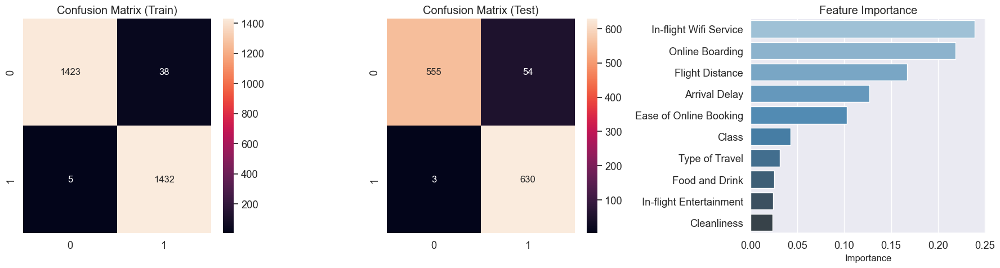

In [119]:
randomForest(group_0_9_model,500,14,group_0_9_accuracy)

Train Accuracy: 0.94589 | Test Accuracy: 0.91408
TPR Train:      0.94526     | TPR Test: 0.91668
TNR Train:      0.94652     | TNR Test: 0.91154
FPR Train:      0.05348     | FPR Test: 0.08846
FNR Train:      0.05474     | FNR Test: 0.08332


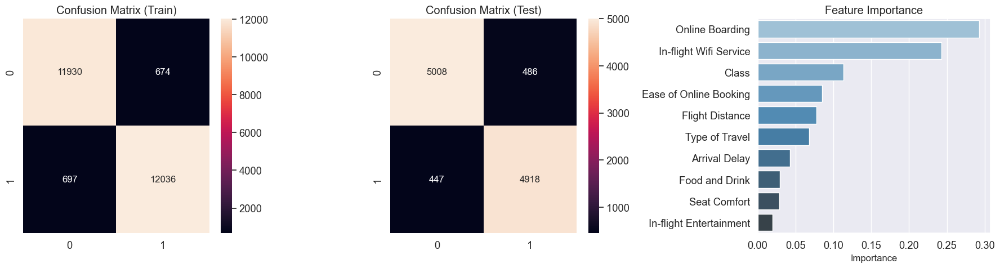

In [120]:
randomForest(group_10_25_model,900,14,group_10_25_accuracy)

Train Accuracy: 0.95281 | Test Accuracy: 0.93891
TPR Train:      0.94410     | TPR Test: 0.93493
TNR Train:      0.96152     | TNR Test: 0.94288
FPR Train:      0.03848     | FPR Test: 0.05712
FNR Train:      0.05590     | FNR Test: 0.06507


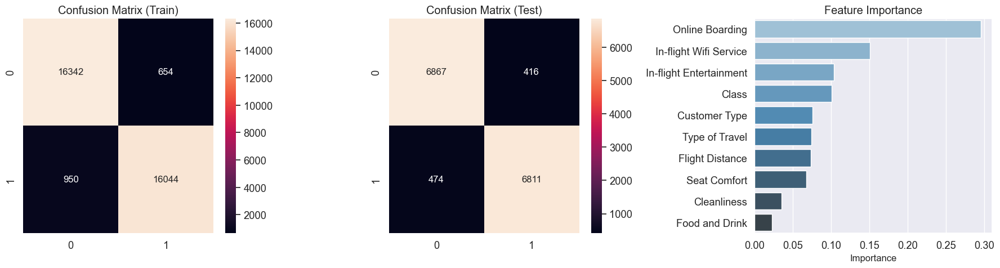

In [121]:
randomForest(group_26_41_model,600,14,group_26_41_accuracy)

Train Accuracy: 0.97575 | Test Accuracy: 0.95749
TPR Train:      0.95961     | TPR Test: 0.93280
TNR Train:      0.99191     | TNR Test: 0.98211
FPR Train:      0.00809     | FPR Test: 0.01789
FNR Train:      0.04039     | FNR Test: 0.06720


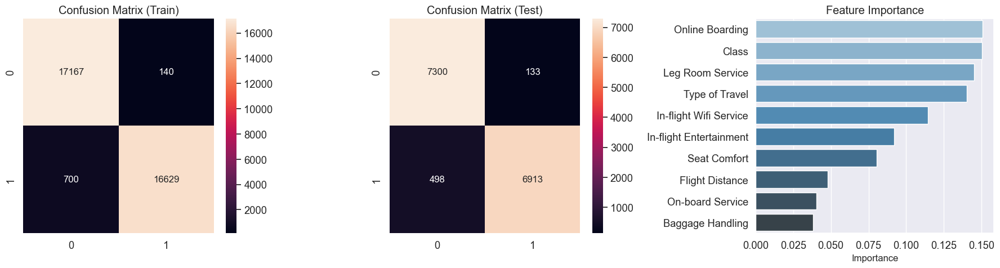

In [122]:
randomForest(group_42_57_model,600,14,group_42_57_accuracy)

Train Accuracy: 0.98413 | Test Accuracy: 0.96257
TPR Train:      0.97791     | TPR Test: 0.95256
TNR Train:      0.99036     | TNR Test: 0.97259
FPR Train:      0.00964     | FPR Test: 0.02741
FNR Train:      0.02209     | FNR Test: 0.04744


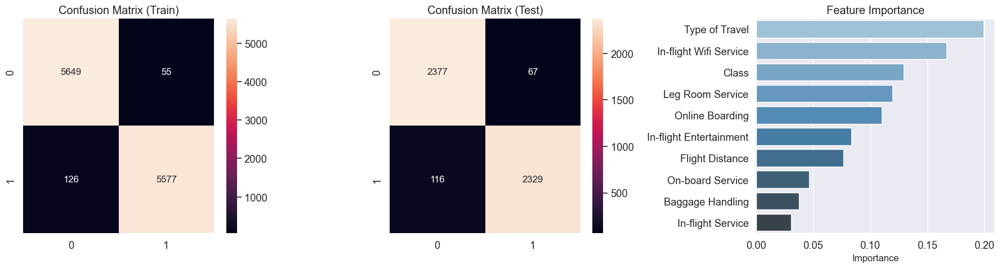

In [123]:
randomForest(group_58_67_model,1000,14,group_58_67_accuracy)

Train Accuracy: 0.99710 | Test Accuracy: 0.96820
TPR Train:      1.00000     | TPR Test: 0.98127
TNR Train:      0.99404     | TNR Test: 0.95663
FPR Train:      0.00596     | FPR Test: 0.04337
FNR Train:      0.00000     | FNR Test: 0.01873


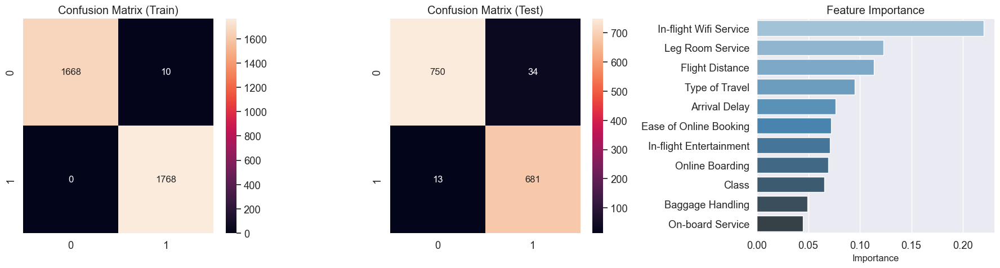

In [124]:
randomForest(group_68_76_model,1000,14,group_68_76_accuracy)

Train Accuracy: 1.00000 | Test Accuracy: 0.97351
TPR Train:      1.00000     | TPR Test: 1.00000
TNR Train:      1.00000     | TNR Test: 0.94286
FPR Train:      0.00000     | FPR Test: 0.05714
FNR Train:      0.00000     | FNR Test: 0.00000


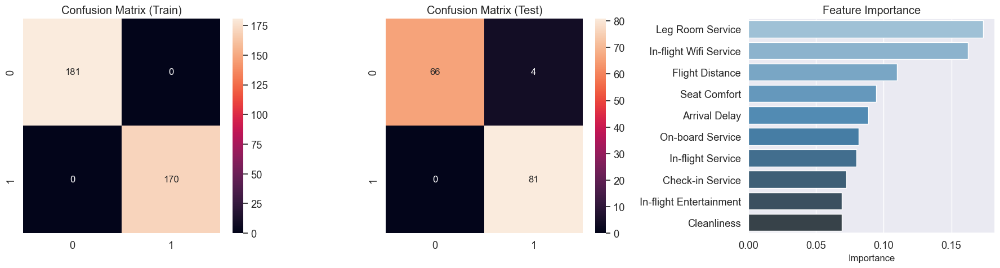

In [125]:
randomForest(group_77_94_model,600,13,group_77_94_accuracy)

Upon implementing the optimized hyperparameters obtained from GV Search, the classification accuracy of both the train and test datasets appear to be quite similar, indicating the absence of overfitting. Overfitting occurs when a model fits well on the train dataset but fails to perform well on the test dataset, leading to poor classification accuracy, true positive and true negative values. However, in this case, the classification accuracy, true positive and true negative values for both datasets are comparable, indicating that overfitting did not occur.

Nevertheless, it is noteworthy that the classification accuracy, true positive and true negative values remain significantly high. This can be attributed to the upsampling technique applied to the review score 0 class earlier. It is important to note that upsampling can lead to overfitting, and thus, it is crucial to exercise caution while using such techniques.

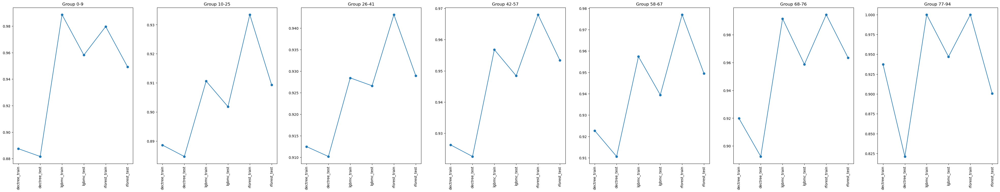

In [551]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(ncols=7, figsize=(50, 8))

ax1.plot(group_0_9_accuracy.keys(), group_0_9_accuracy.values(), linestyle='-', marker='o')
ax1.set_xticks(range(len(group_0_9_accuracy)))
ax1.set_xticklabels(list(group_0_9_accuracy.keys()), rotation=90)
ax1.set_title('Group 0-9')

ax2.plot(group_10_25_accuracy.keys(), group_10_25_accuracy.values(), linestyle='-', marker='o')
ax2.set_xticks(range(len(group_10_25_accuracy)))
ax2.set_xticklabels(list(group_10_25_accuracy.keys()), rotation=90)
ax2.set_title('Group 10-25')

ax3.plot(group_26_41_accuracy.keys(), group_26_41_accuracy.values(), linestyle='-', marker='o')
ax3.set_xticks(range(len(group_26_41_accuracy)))
ax3.set_xticklabels(list(group_26_41_accuracy.keys()), rotation=90)
ax3.set_title('Group 26-41')

ax4.plot(group_42_57_accuracy.keys(), group_42_57_accuracy.values(), linestyle='-', marker='o')
ax4.set_xticks(range(len(group_42_57_accuracy)))
ax4.set_xticklabels(list(group_42_57_accuracy.keys()), rotation=90)
ax4.set_title('Group 42-57')

ax5.plot(group_58_67_accuracy.keys(), group_58_67_accuracy.values(), linestyle='-', marker='o')
ax5.set_xticks(range(len(group_58_67_accuracy)))
ax5.set_xticklabels(list(group_58_67_accuracy.keys()), rotation=90)
ax5.set_title('Group 58-67')

ax6.plot(group_68_76_accuracy.keys(), group_68_76_accuracy.values(), linestyle='-', marker='o')
ax6.set_xticks(range(len(group_68_76_accuracy)))
ax6.set_xticklabels(list(group_68_76_accuracy.keys()), rotation=90)
ax6.set_title('Group 68-76')

ax7.plot(group_77_94_accuracy.keys(), group_77_94_accuracy.values(), linestyle='-', marker='o')
ax7.set_xticks(range(len(group_77_94_accuracy)))
ax7.set_xticklabels(list(group_77_94_accuracy.keys()), rotation=90)
ax7.set_title('Group 77-94')

plt.show()


### Among these 3 models, we can see from this graph that we can consider random forest with grid search as the best model for our prediction.


# Feature Importance among these three models

Group_0_9: Online Boarding, In-flight Wifi Service, (Flight Distance)

Group_10_25: Online Boarding, In-flight Wifi Service,(Flight Distance and Arrival Delay)

Group_26_41: Online Boarding, In-flight Wifi Service,(Flight Distance)

Group_42_57: Class, Leg Room Service, In-flight Wifi Service, Online Boarding (Flight Distance)

Group_58_67: Type of Travel, In-flight Wifi Service, Online Boarding (Flight Distance)

Group_68_76: In-flight Wifi Service, Leg room, Flight Distance

Group_77_94: Leg room, In-flight Wifi Service, Flight Distance

# Conclusion

After utilizing the decision tree model, we can conclude that it is a straightforward and easy-to-interpret model that can be visually represented, making it easy to understand the decision-making process. However, based on the results of our LazyPredict analysis and the outcome of the model, the accuracy of the decision tree model may not be as high as other machine learning models across all age groups. Despite this, we decided to implement the decision tree model as our initial prediction model due to its simplicity and ease of understanding.

Moving forward, based on the results from LaztPredict,the LGBMClassifier model appeared to be a suitable choice for all dataset. 

The "best score" refers to the mean cross-validated score of the best_estimator model obtained through the GridSearchCV function, which splits the train and test datasets five times for each hyperparameter combination. This means that the best score is calculated for each combination of hyperparameters and for each trial. The final "best score" is the average of the best hyperparameter combination obtained in those five trials.

After obtaining the best hyperparameters for the model, i.e., max_depth and n_estimators, the model is run using the Random Forest algorithm. The results indicate that the classification accuracy, true positive and true negative values are all above 95%, while the false positive and false negative values are less than 1% for all generations. Moreover, there is a high degree of similarity between the train and test datasets, suggesting the absence of overfitting, as discussed earlier.

However, the accuracy of group_77_94 for both LGBMClassifier and Randomforest is exactly 1 so that means these two models are overfitting. We believe that this may be due to the limited number of data samples in this age group, which may not accurately represent all possible input data values.

Overall, it is important to evaluate and fine-tune machine learning models carefully to ensure reliable and accurate predictions. It may also be necessary to collect more data or apply data augmentation techniques to improve the representation of certain age groups and enhance the model's performance.